# Photometric Stereo

# To run:

1. Set up 


./setup_venv.sh


 2. Activate virtual environment


source venv_photometric/bin/activate

3. Start Jupyter Notebook


jupyter notebook

4. When done, deactivate


deactivate

## Import Libraries

In [3]:
import os
from pathlib import Path
import zipfile
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pathlib import Path
import glob


# Assign Data

In [4]:
# Data paths
DATA_DIR = 'data/guy'
MASK_DIR = 'data/guy/masks'

# Mask files
OBJECT_MASK = 'object_mask.png'
PROBE_MASK = 'probe_mask.png'
COLOR_MASK = 'color_mask.png'


## Load Data

Loading images...
Loaded 60 images with shape: (60, 1080, 1920, 3)

Loading masks...


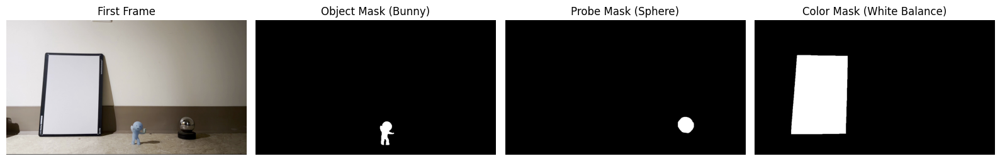

In [7]:
def load_images_from_folder(image_folder):
    """Load all JPG frames from folder, sorted by frame number."""
    image_files = sorted(glob.glob(os.path.join(image_folder, 'frame_*.jpg')))
    
    if len(image_files) == 0:
        raise ValueError(f'No frame_*.jpg files found in {image_folder}')
    
    images = []
    for img_path in image_files:
        img = cv2.imread(img_path)
        if img is None:
            print(f'Warning: Could not load {img_path}')
            continue
        images.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    return np.array(images), [os.path.basename(f) for f in image_files]

def load_mask(mask_folder, mask_name):
    """Load binary mask from image file (white=object, black=background)."""
    mask_path = os.path.join(mask_folder, mask_name)
    mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    if mask_img is None:
        raise ValueError(f'Could not load mask: {mask_path}')
    
    # Convert to binary: white (255) -> 1, black (0) -> 0
    mask = (mask_img > 127).astype(np.uint8)
    return mask

# Load images
print("Loading images...")
images, frame_names = load_images_from_folder(DATA_DIR)
print(f'Loaded {len(images)} images with shape: {images.shape}')

# Load all masks
print("\nLoading masks...")
object_mask = load_mask(MASK_DIR, OBJECT_MASK)
probe_mask = load_mask(MASK_DIR, PROBE_MASK)
color_mask = load_mask(MASK_DIR, COLOR_MASK)


# Visualize loaded data
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(images[0])
axes[0].set_title('First Frame')
axes[0].axis('off')

axes[1].imshow(object_mask, cmap='gray')
axes[1].set_title('Object Mask (Bunny)')
axes[1].axis('off')

axes[2].imshow(probe_mask, cmap='gray')
axes[2].set_title('Probe Mask (Sphere)')
axes[2].axis('off')

axes[3].imshow(color_mask, cmap='gray')
axes[3].set_title('Color Mask (White Balance)')
axes[3].axis('off')

plt.tight_layout()
plt.show()


Detecting sphere...


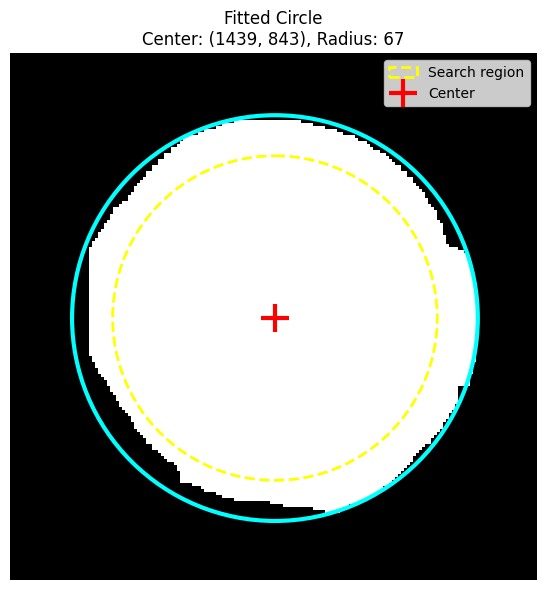

Sphere center: (1439, 843), radius: 67

Calculating light directions...


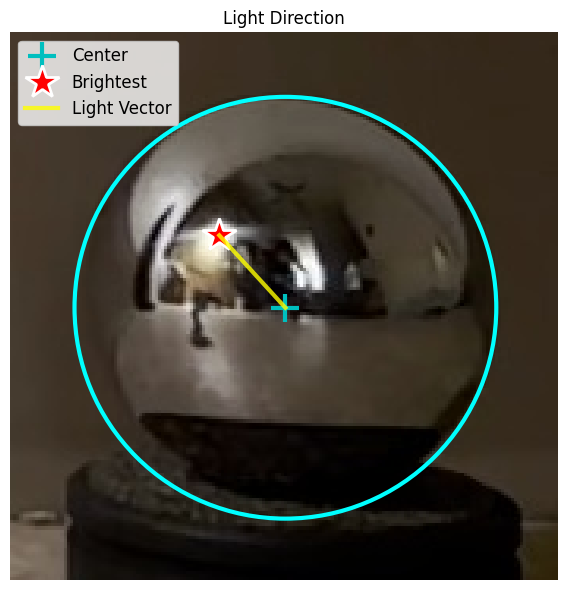

Frame 1: Light direction = [-0.313, -0.343,  0.885]
Frame 2: Light direction = [-0.224, -0.433,  0.873]
Frame 3: Light direction = [-0.358, -0.597,  0.718]
Frame 4: Light direction = [-0.343, -0.567,  0.749]
Frame 5: Light direction = [-0.403, -0.567,  0.718]
Frame 6: Light direction = [-0.418, -0.642,  0.643]
Frame 7: Light direction = [ 0.134, -0.209,  0.969]
Frame 8: Light direction = [-0.254, -0.701,  0.666]
Frame 9: Light direction = [-0.224, -0.716,  0.661]
Frame 10: Light direction = [-0.015, -0.463,  0.886]
Frame 11: Light direction = [ 0.060, -0.507,  0.860]
Frame 12: Light direction = [ 0.119, -0.448,  0.886]
Frame 13: Light direction = [ 0.224, -0.582,  0.782]
Frame 14: Light direction = [ 0.239, -0.478,  0.845]
Frame 15: Light direction = [ 0.313, -0.463,  0.829]
Frame 16: Light direction = [ 0.448, -0.507,  0.736]
Frame 17: Light direction = [ 0.493, -0.373,  0.786]
Frame 18: Light direction = [ 0.582, -0.343,  0.737]
Frame 19: Light direction = [ 0.597,  0.000,  0.802]
Fr

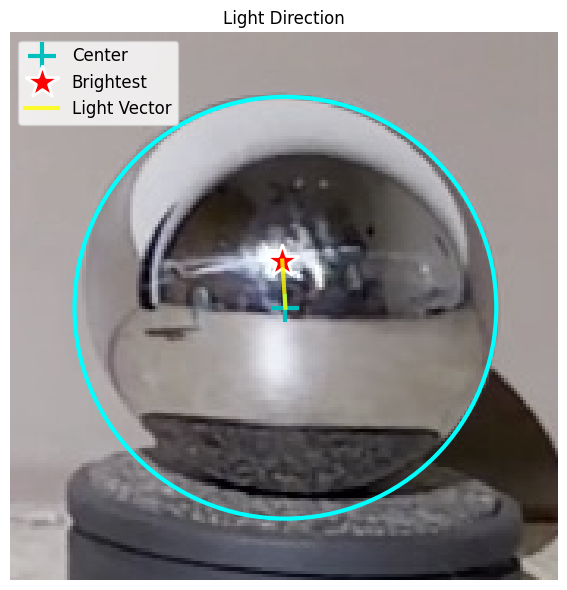

Frame 60: Light direction = [-0.015, -0.224,  0.975]


In [37]:
# Light direction calibration functions
def find_sphere_center_and_radius(mask, debug=True):
    """Find center and radius of sphere from mask using contours."""
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        raise ValueError("No contours found in probe mask")
    
    largest_contour = max(contours, key=cv2.contourArea)
    (cx, cy), radius = cv2.minEnclosingCircle(largest_contour)
    cx, cy, radius = int(cx), int(cy), int(radius)
    
    if debug:
        # Define crop region around sphere
        crop_margin = int(radius * 1.3)
        y_min = max(0, cy - crop_margin)
        y_max = min(mask.shape[0], cy + crop_margin)
        x_min = max(0, cx - crop_margin)
        x_max = min(mask.shape[1], cx + crop_margin)
        
        fig, axes = plt.subplots(1, 1, figsize=(12, 6))

        # Show fitted circle (cropped)
        mask_crop_gray = mask[y_min:y_max, x_min:x_max]
        axes.imshow(mask_crop_gray, cmap='gray')
        circle = plt.Circle((cx - x_min, cy - y_min), radius, color='cyan', fill=False, linewidth=3)
        axes.add_patch(circle)
        # Add inner search circle
        circle_inner = plt.Circle((cx - x_min, cy - y_min), radius * 0.8, 
                                  color='yellow', fill=False, linewidth=2, 
                                  linestyle='--', label='Search region')
        axes.add_patch(circle_inner)
        axes.plot(cx - x_min, cy - y_min, 'r+', markersize=20, markeredgewidth=3, label='Center')
        axes.set_title(f'Fitted Circle\nCenter: ({cx}, {cy}), Radius: {radius}')
        axes.legend()
        axes.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return (cx, cy), radius


def find_brightest_point(image, center, radius, mask_inner_ratio=0.8, debug=False):
    """Find brightest point on sphere (specular highlight)."""
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if image.ndim == 3 else image
    cx, cy = center
    H, W = gray.shape
    Y, X = np.ogrid[:H, :W]
    
    mask = (X - cx) ** 2 + (Y - cy) ** 2 <= (radius * mask_inner_ratio) ** 2
    masked = gray * mask
    
    coords = np.argwhere(masked == masked.max())
    y_bright, x_bright = coords.mean(axis=0).astype(int)
    
    if debug:
        # Crop tightly around sphere
        crop_margin = int(radius * 1.3)
        y_min = max(0, cy - crop_margin)
        y_max = min(H, cy + crop_margin)
        x_min = max(0, cx - crop_margin)
        x_max = min(W, cx + crop_margin)
        
        fig, axes = plt.subplots(1, 1, figsize=(18, 6))
        
        # Original image with sphere (cropped)
        img_crop = image[y_min:y_max, x_min:x_max] if image.ndim == 3 else gray[y_min:y_max, x_min:x_max]
        
        # Brightest point on original (cropped)
        axes.imshow(img_crop, cmap='gray' if image.ndim == 2 else None)
        circle = plt.Circle((cx - x_min, cy - y_min), radius, color='cyan', fill=False, linewidth=3)
        axes.add_patch(circle)
        axes.plot(cx - x_min, cy - y_min, 'c+', markersize=20, markeredgewidth=3, label='Center')
        axes.plot(x_bright - x_min, y_bright - y_min, 'r*', markersize=25, 
                    markeredgecolor='white', markeredgewidth=2, label='Brightest')
        axes.plot([cx - x_min, x_bright - x_min], [cy - y_min, y_bright - y_min], 
                    'yellow', linewidth=3, alpha=0.8, label='Light Vector')
        axes.set_title('Light Direction')
        axes.legend(fontsize=12)
        axes.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return (x_bright, y_bright)


def compute_light_direction_from_sphere(x_bright, y_bright, cx, cy, radius):
    """Calculate 3D light direction from brightest point on sphere."""
    x_star, y_star = x_bright - cx, y_bright - cy
    z_squared = radius**2 - x_star**2 - y_star**2
    z_star = np.sqrt(max(z_squared, 0))
    light_dir = np.array([x_star, y_star, z_star])
    return light_dir / np.linalg.norm(light_dir)


# Find sphere parameters
print("\nDetecting sphere...")
sphere_center, sphere_radius = find_sphere_center_and_radius(probe_mask, debug=True)
print(f"Sphere center: {sphere_center}, radius: {sphere_radius}")


# Calculate light directions for all frames
print("\nCalculating light directions...")
light_directions = []

for i, img in enumerate(images):
    # Show debug visualization for first and last frames
    debug = (i == 0 or i == len(images) - 1)
    
    x_bright, y_bright = find_brightest_point(img, sphere_center, sphere_radius, debug=debug)
    light_dir = compute_light_direction_from_sphere(
        x_bright, y_bright, 
        sphere_center[0], sphere_center[1], 
        sphere_radius
    )
    
    light_directions.append(light_dir)
    print(f"Frame {i+1}: Light direction = [{light_dir[0]:6.3f}, {light_dir[1]:6.3f}, {light_dir[2]:6.3f}]")

light_directions = np.array(light_directions)




Applying white balance correction...
Measured white RGB: [205.8, 208.9, 221.4]


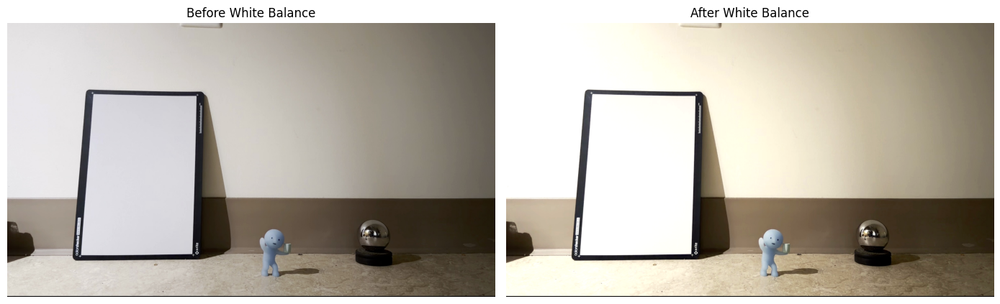

In [14]:
# White balance correction
def extract_white_balance_color(images, color_mask):
    """Extract average RGB color from white balance card."""
    white_pixels = images[:, color_mask > 0, :]
    white_rgb = white_pixels.mean(axis=(0, 1))
    return white_rgb

def apply_white_balance(images, white_rgb, target_white=255.0):
    """Apply white balance correction to images."""
    correction_factors = target_white / white_rgb
    corrected = images * correction_factors[np.newaxis, np.newaxis, np.newaxis, :]
    corrected = np.clip(corrected, 0, 255).astype(np.uint8)
    return corrected

print("\nApplying white balance correction...")
white_rgb = extract_white_balance_color(images, color_mask)
print(f"Measured white RGB: [{white_rgb[0]:.1f}, {white_rgb[1]:.1f}, {white_rgb[2]:.1f}]")

images_corrected = apply_white_balance(images, white_rgb)

# Simple before/after white balance visualization
def show_white_balance(before, after, idx=0):
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(before[idx])
    axes[0].set_title('Before White Balance')
    axes[0].axis('off')
    axes[1].imshow(after[idx])
    axes[1].set_title('After White Balance')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

# Use it
show_white_balance(images, images_corrected, idx=0)


## Now we can calculate normals!

### Mathematical Foundation

**Image Formation Model:**

For a Lambertian surface under directional lighting, the observed intensity at pixel $x$ is:

$$I(x) = \rho(x) \cdot \mathbf{n}(x)^T \mathbf{l}$$

where:
- $I(x)$ = observed intensity at pixel $x$
- $\rho(x)$ = albedo (reflectance) at pixel $x$, where $\rho \in [0, 1]$
- $\mathbf{n}(x)$ = unit surface normal at pixel $x$, where $\|\mathbf{n}\| = 1$
- $\mathbf{l}$ = light direction vector (unit length)

The dot product $\mathbf{n}^T \mathbf{l} = \cos\theta$ represents Lambert's cosine law.

### Photometric Stereo - Core Equation

Given $n$ images of the same object under different lighting directions, we can write for each pixel:

$$\begin{bmatrix} I_1 \\\\ I_2 \\\\ \vdots \\\\ I_n \end{bmatrix} = \begin{bmatrix} \mathbf{l}_1^T \\\\ \mathbf{l}_2^T \\\\ \vdots \\\\ \mathbf{l}_n^T \end{bmatrix} \begin{bmatrix} \rho n_x \\\\ \rho n_y \\\\ \rho n_z \end{bmatrix} = \mathbf{L} \mathbf{b}$$

where:
- $\mathbf{I} \in \mathbb{R}^{n \times 1}$ is the vector of observed intensities
- $\mathbf{L} \in \mathbb{R}^{n \times 3}$ is the matrix of light directions (each row is a unit vector)
- $\mathbf{b} = \rho \mathbf{n} \in \mathbb{R}^{3 \times 1}$ is the **pseudo-normal** (albedo × normal)

**Least Squares Solution:**

$$\mathbf{b} = (\mathbf{L}^T \mathbf{L})^{-1} \mathbf{L}^T \mathbf{I}$$

**Extracting Albedo and Normal:**

$$\rho = \|\mathbf{b}\| = \sqrt{b_x^2 + b_y^2 + b_z^2}$$

$$\mathbf{n} = \frac{\mathbf{b}}{\|\mathbf{b}\|} = \frac{\mathbf{b}}{\rho}$$

**Shadow Handling:**

To handle shadows and specularities, we discard the darkest $k\\%$ of observations for each pixel before solving the least squares problem, where $k = 20$ in our implementation.

## Estimate Surface Normals and Albedo

Estimating surface normals...
Processing 12098 pixels...
Using 48 brightest observations per pixel (discarding darkest 12)
  Row 0/1080...
  Row 100/1080...
  Row 200/1080...
  Row 300/1080...
  Row 400/1080...
  Row 500/1080...
  Row 600/1080...
  Row 700/1080...
  Row 800/1080...
  Row 900/1080...
  Row 1000/1080...
✓ Estimated normals and albedo (ignoring darkest 20% intensities)


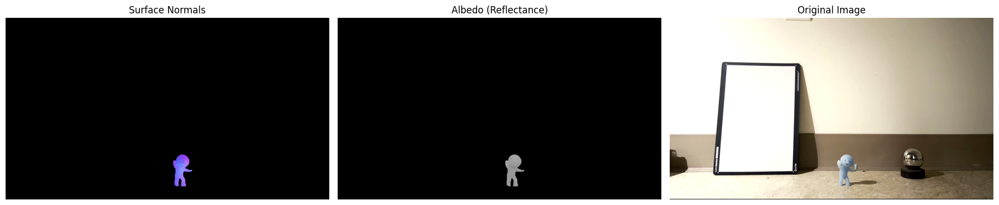

In [17]:
def estimate_surface_normals(images, light_directions, mask, shadow_threshold=0.2):
    """Estimate surface normals with shadow handling - ignores darkest 20% of intensities"""
    num_images, H, W, C = images.shape
    gray_images = np.mean(images, axis=3)
    normal_map = np.zeros((H, W, 3))
    albedo_map = np.zeros((H, W))
    
    L = light_directions
    n_lights = L.shape[0]
    n_discard = int(n_lights * shadow_threshold)
    
    print(f"Processing {np.sum(mask)} pixels...")
    print(f"Using {n_lights - n_discard} brightest observations per pixel (discarding darkest {n_discard})")
    
    for i in range(H):
        if i % 100 == 0:
            print(f"  Row {i}/{H}...")
        for j in range(W):
            if mask[i, j] == 0:
                continue
            
            # Get intensity observations for this pixel
            I_pixel = gray_images[:, i, j]
            
            # Remove shadows - discard darkest observations
            if n_discard > 0:
                bright_indices = np.argsort(I_pixel)[n_discard:]
                I_bright = I_pixel[bright_indices]
                L_bright = L[bright_indices]
            else:
                I_bright = I_pixel
                L_bright = L
            
            # Solve least squares with bright observations only
            if len(I_bright) >= 3:
                try:
                    LtL_inv = np.linalg.inv(L_bright.T @ L_bright)
                    b = LtL_inv @ L_bright.T @ I_bright
                    albedo = np.linalg.norm(b)
                    if albedo > 1e-6:
                        normal_map[i, j] = b / albedo
                        albedo_map[i, j] = albedo
                except np.linalg.LinAlgError:
                    pass
    
    return normal_map, albedo_map



print("Estimating surface normals...")
normal_map, albedo_map = estimate_surface_normals(images_corrected, light_directions, object_mask, shadow_threshold=0.2)
print(f'✓ Estimated normals and albedo (ignoring darkest 20% intensities)')

# Visualize results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Normal map (convert to RGB for visualization)
normal_vis = (normal_map + 1) / 2  # Map from [-1,1] to [0,1]
normal_vis = normal_vis * object_mask[:, :, np.newaxis]
axes[0].imshow(normal_vis)
axes[0].set_title('Surface Normals')
axes[0].axis('off')

# Albedo map
albedo_vis = albedo_map * object_mask
axes[1].imshow(albedo_vis, cmap='gray')
axes[1].set_title('Albedo (Reflectance)')
axes[1].axis('off')

# Original image for comparison
axes[2].imshow(images_corrected[0])
axes[2].set_title('Original Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

### RGB Albedo Recovery

For color images, we recover the RGB albedo separately for each color channel $c \in \{R, G, B\}$:

$$I_c(x) = \rho_c(x) \cdot \mathbf{n}(x)^T \mathbf{l}$$

Given the already-estimated surface normal $\mathbf{n}(x)$, we solve for $\rho_c(x)$:

$$\rho_c(x) = \frac{\sum_{i=1}^{n} I_{c,i}(x) \cdot (\mathbf{n}(x)^T \mathbf{l}_i)}{\sum_{i=1}^{n} (\mathbf{n}(x)^T \mathbf{l}_i)^2}$$

This gives us the color albedo map $\mathbf{\rho}(x) = [\rho_R(x), \rho_G(x), \rho_B(x)]^T$.

## Recover RGB Albedo

Calculating RGB albedo for 3 color channels...
✓ Recovered RGB albedo


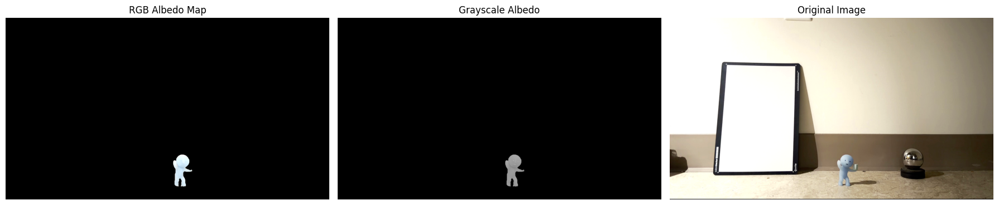

In [ ]:
def calculate_color_from_normals(images, light_directions, normal_map, mask):
    """Calculate RGB albedo from images, normals, and light directions"""
    num_images, H, W, C = images.shape
    color_map = np.zeros((H, W, 3))
    
    print(f"Calculating RGB albedo for {C} color channels...")
    
    for c in range(3):
        I_c = images[:, :, :, c].reshape(num_images, H * W)
        normals_flat = normal_map.reshape(H * W, 3)
        shading = (normals_flat @ light_directions.T).T
        numerator = np.sum(I_c * shading, axis=0)
        denominator = np.sum(shading * shading, axis=0)
        albedo_c = np.zeros(H * W)
        valid = denominator > 1e-6
        albedo_c[valid] = numerator[valid] / denominator[valid]
        color_map[:, :, c] = albedo_c.reshape(H, W)
    
    color_map = color_map * mask[:, :, np.newaxis]
    return np.clip(color_map, 0, 255)


# Call with your bunny data variables
color_map = calculate_color_from_normals(images_corrected, light_directions, normal_map, object_mask)
print(f'✓ Recovered RGB albedo')

# Visualize the color map
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Color albedo map
axes[0].imshow(color_map.astype(np.uint8))
axes[0].set_title('RGB Albedo Map')
axes[0].axis('off')

# Grayscale albedo for comparison
axes[1].imshow(albedo_map * object_mask, cmap='gray')
axes[1].set_title('Grayscale Albedo')
axes[1].axis('off')

# Original image
axes[2].imshow(images_corrected[0])
axes[2].set_title('Original Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

### Surface Integration - Frankot-Chellappa Algorithm

Given the surface normal $\mathbf{n}(x,y) = [n_x, n_y, n_z]^T$, we can compute the **gradient field**:

$$p(x,y) = -\frac{n_x}{n_z} = \frac{\partial z}{\partial x}, \\quad q(x,y) = -\frac{n_y}{n_z} = \frac{\partial z}{\partial y}$$

**Integrability Constraint:**

For a valid surface, the mixed partial derivatives must be equal:

$$\frac{\partial p}{\partial y} = \frac{\partial q}{\partial x}$$

However, due to noise, this is rarely satisfied. The **Frankot-Chellappa method** enforces integrability in the Fourier domain.

**Fourier Domain Solution:**

Taking the 2D Fourier transform:

$$\hat{Z}(\omega_x, \omega_y) = \frac{-j\omega_x \hat{P}(\omega_x, \omega_y) - j\omega_y \hat{Q}(\omega_x, \omega_y)}{\omega_x^2 + \omega_y^2}$$

where:
- $\hat{Z}, \hat{P}, \hat{Q}$ are the Fourier transforms of $z, p, q$
- $\omega_x, \omega_y$ are the frequency variables
- $j = \sqrt{-1}$

The depth map is recovered by inverse Fourier transform:

$$z(x,y) = \mathcal{F}^{-1}\{\hat{Z}(\omega_x, \omega_y)\}$$

This method finds the least-squares optimal surface that best fits the gradient field.

## Integrate Normals to Depth


Integrating normals to depth (Frankot-Chellappa)...


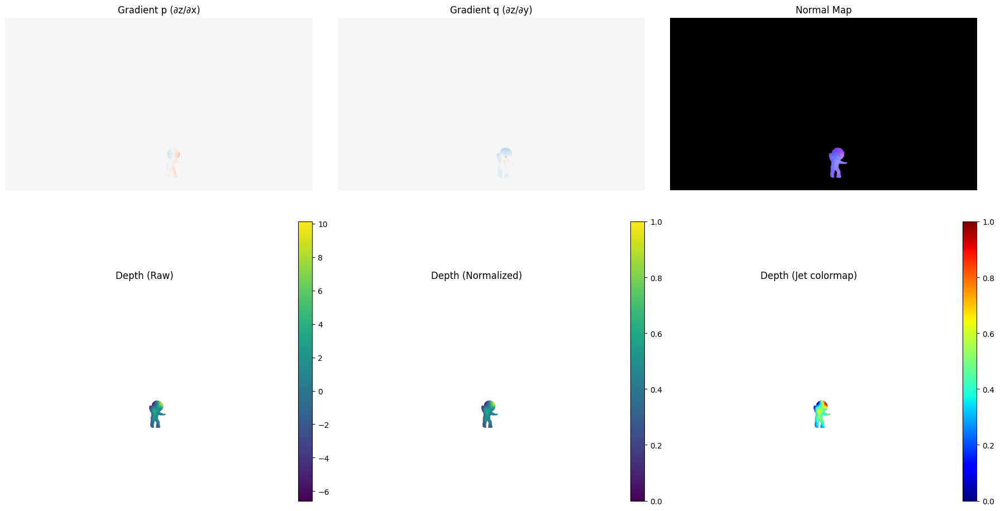

In [20]:
def integrate_frankot(normal_map, mask):
    """
    Integrate surface normals to depth using Frankot-Chellappa algorithm.
    
    Reference: Frankot & Chellappa (1988) "A Method for Enforcing Integrability 
    in Shape from Shading Algorithms." IEEE TPAMI 10(4):439-451.
    
    Args:
        normal_map: HxWx3 array of surface normals
        mask: HxW binary mask
    
    Returns:
        depth_map: HxW depth map
    """
    H, W, _ = normal_map.shape
    
    # Pad to power of 2 for FFT efficiency
    nrows = 2 ** int(np.ceil(np.log2(H)))
    ncols = 2 ** int(np.ceil(np.log2(W)))
    
    # Extract normal components
    nx, ny, nz = normal_map[:, :, 0], normal_map[:, :, 1], normal_map[:, :, 2]
    
    # Compute surface gradients (p = dz/dx, q = dz/dy)
    # Only where normals are valid
    valid = (np.abs(nz) > 1e-8) & (mask > 0)
    
    p = np.zeros((H, W))
    q = np.zeros((H, W))
    p[valid] = -nx[valid] / nz[valid]
    q[valid] = -ny[valid] / nz[valid]
    
    # FFT of gradients with zero-padding
    P = np.fft.fft2(p, s=[nrows, ncols])
    Q = np.fft.fft2(q, s=[nrows, ncols])
    
    # Frequency coordinates (as in Frankot-Chellappa paper)
    wx = np.fft.fftfreq(nrows).reshape(-1, 1) * 2 * np.pi
    wy = np.fft.fftfreq(ncols).reshape(1, -1) * 2 * np.pi
    
    # Avoid division by zero at DC component
    denom = wx**2 + wy**2
    denom[0, 0] = 1.0  # Will be set to zero anyway
    
    # Solve in Fourier domain: Z = (-j*wx*P - j*wy*Q) / (wx^2 + wy^2)
    Z_fft = (-1j * wx * P - 1j * wy * Q) / denom
    Z_fft[0, 0] = 0.0  # Zero DC component (mean depth = 0)
    
    # Inverse FFT to get depth
    depth = np.real(np.fft.ifft2(Z_fft))
    
    # Crop to original size and apply mask
    depth_map = depth[:H, :W] * mask
    
    return depth_map


# Use it
print("\nIntegrating normals to depth (Frankot-Chellappa)...")
depth_map = integrate_frankot(normal_map, object_mask)

# Visualize
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Row 1: Gradients and normals
nx, ny, nz = normal_map[:, :, 0], normal_map[:, :, 1], normal_map[:, :, 2]
valid = (np.abs(nz) > 1e-8) & (object_mask > 0)
p, q = np.zeros_like(nx), np.zeros_like(ny)
p[valid] = -nx[valid] / nz[valid]
q[valid] = -ny[valid] / nz[valid]

axes[0, 0].imshow(p * object_mask, cmap='RdBu', vmin=-2, vmax=2)
axes[0, 0].set_title('Gradient p (∂z/∂x)')
axes[0, 0].axis('off')

axes[0, 1].imshow(q * object_mask, cmap='RdBu', vmin=-2, vmax=2)
axes[0, 1].set_title('Gradient q (∂z/∂y)')
axes[0, 1].axis('off')

normal_vis = (normal_map + 1) / 2 * object_mask[:, :, np.newaxis]
axes[0, 2].imshow(normal_vis)
axes[0, 2].set_title('Normal Map')
axes[0, 2].axis('off')

# Row 2: Depth visualizations
masked_depth = np.ma.masked_where(object_mask == 0, depth_map)

im0 = axes[1, 0].imshow(masked_depth, cmap='viridis')
axes[1, 0].set_title('Depth (Raw)')
axes[1, 0].axis('off')
plt.colorbar(im0, ax=axes[1, 0], fraction=0.046)

# Normalized depth
depth_norm = depth_map.copy()
if object_mask.sum() > 0:
    d_min, d_max = depth_map[object_mask > 0].min(), depth_map[object_mask > 0].max()
    if d_max - d_min > 1e-6:
        depth_norm[object_mask > 0] = (depth_map[object_mask > 0] - d_min) / (d_max - d_min)

masked_norm = np.ma.masked_where(object_mask == 0, depth_norm)
im1 = axes[1, 1].imshow(masked_norm, cmap='viridis')
axes[1, 1].set_title('Depth (Normalized)')
axes[1, 1].axis('off')
plt.colorbar(im1, ax=axes[1, 1], fraction=0.046)

im2 = axes[1, 2].imshow(masked_norm, cmap='jet')
axes[1, 2].set_title('Depth (Jet colormap)')
axes[1, 2].axis('off')
plt.colorbar(im2, ax=axes[1, 2], fraction=0.046)

plt.tight_layout()
plt.show()


## We may have to flip an axis to get the correct orientations

we try all 4 permutations here

In [21]:
def integrate_with_flips(normal_map, mask, flip_x=False, flip_y=False, flip_z=False):
    """
    Integrate normals with specified axis flips.
    """
    H, W, _ = normal_map.shape
    
    # Apply flips to normal components
    nm = normal_map.copy()
    if flip_x:
        nm[:, :, 0] = -nm[:, :, 0]
    if flip_y:
        nm[:, :, 1] = -nm[:, :, 1]
    if flip_z:
        nm[:, :, 2] = -nm[:, :, 2]
    
    nx, ny, nz = nm[:, :, 0], nm[:, :, 1], nm[:, :, 2]
    
    # Standard integration
    eps = 1e-8
    nz = np.where(np.abs(nz) < eps, eps, nz)
    
    p = -nx / nz
    q = -ny / nz
    
    p, q = p * mask, q * mask
    
    # Frankot-Chellappa
    ky = np.fft.fftfreq(H, d=1.0).reshape(H, 1)
    kx = np.fft.fftfreq(W, d=1.0).reshape(1, W)
    
    P, Q = np.fft.fft2(p), np.fft.fft2(q)
    
    denom = (kx**2 + ky**2)
    denom[0, 0] = 1.0
    
    j = 1j
    Z_hat = (-j * kx * P - j * ky * Q) / denom
    Z_hat[0, 0] = 0.0
    
    z = np.fft.ifft2(Z_hat).real
    return z * mask


def test_four_flips(normal_map, mask):
    """
    Test only 4 single-axis flip combinations: original, flip_x, flip_y, flip_z
    """
    results = {}
    
    print("Testing 4 coordinate flip combinations...")
    print("="*70)
    
    # Only test single-axis flips
    flip_configs = [
        (False, False, False, "original"),
        (True,  False, False, "flip_x"),
        (False, True,  False, "flip_y"),
        (False, False, True,  "flip_z"),
    ]
    
    for flip_x, flip_y, flip_z, name in flip_configs:
        depth = integrate_with_flips(normal_map, mask, flip_x, flip_y, flip_z)
        results[name] = depth
        
        # Show which axis is flipped
        if name == 'original':
            flip_str = 'none'
        else:
            flip_str = name.replace('flip_', '').upper()
        
        print(f"✓ {name:12s} (flipped: {flip_str})")
    
    print("\n✓ All 4 variants computed")
    return results


def visualize_four_flips_2d(results, mask):
    """Visualize 4 flip combinations in 2D"""
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    for idx, (name, depth) in enumerate(results.items()):
        ax = axes[idx]
        depth_masked = depth * mask
        depth_masked = np.where(mask > 0, depth_masked, np.nan)
        
        im = ax.imshow(depth_masked, cmap='viridis')
        
        # Create descriptive title
        if name == 'original':
            title = 'Original\n(no flips)'
        else:
            flipped = name.replace('flip_', '').upper()
            title = f'Flip {flipped}\n({name})'
        
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    plt.suptitle('Coordinate Flip Comparison (2D)', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()


def visualize_four_flips_3d(results, mask, albedo_map, subsample=2):
    """Visualize 4 flip combinations in 3D"""
    # Create 1x4 grid of 3D plots
    specs = [[{'type': 'scatter3d'} for _ in range(4)]]
    
    subplot_titles = []
    for name in results.keys():
        if name == 'original':
            subplot_titles.append('Original')
        else:
            flipped = name.replace('flip_', '').upper()
            subplot_titles.append(f'Flip {flipped}')
    
    fig = make_subplots(
        rows=1, cols=4,
        specs=specs,
        subplot_titles=subplot_titles,
        horizontal_spacing=0.02
    )
    
    print("\nCreating 3D visualizations...")
    
    for idx, (name, depth) in enumerate(results.items()):
        col = idx + 1
        
        # Create point cloud
        points_3d = []
        albedo_values = []
        
        H, W = depth.shape
        for i in range(0, H, subsample):
            for j in range(0, W, subsample):
                if mask[i, j] > 0:
                    points_3d.append([j, i, depth[i, j]])
                    albedo_values.append(albedo_map[i, j])
        
        points_3d = np.array(points_3d)
        albedo_values = np.array(albedo_values)
        
        # Add trace
        show_colorbar = (idx == 3)  # Only show on last plot
        
        fig.add_trace(
            go.Scatter3d(
                x=points_3d[:, 0],
                y=points_3d[:, 1],
                z=points_3d[:, 2],
                mode='markers',
                marker=dict(
                    size=2,
                    color=albedo_values,
                    colorscale='Greys',
                    showscale=show_colorbar,
                    colorbar=dict(title="Albedo", x=1.02) if show_colorbar else None
                ),
                showlegend=False
            ),
            row=1, col=col
        )
        
        print(f"  ✓ {name}")
    
    # Update layout
    fig.update_layout(
        title_text="Coordinate Flip Comparison (3D)",
        height=600,
        showlegend=False
    )
    
    # Set same camera angle for all
    camera = dict(eye=dict(x=1.5, y=1.5, z=1.5))
    for j in range(1, 5):
        fig.update_scenes(camera=camera, row=1, col=j)
    
    print("✓ 3D visualization ready")
    fig.show()
    
    return fig


testing flips
Testing 4 coordinate flip combinations...
✓ original     (flipped: none)
✓ flip_x       (flipped: X)
✓ flip_y       (flipped: Y)
✓ flip_z       (flipped: Z)

✓ All 4 variants computed


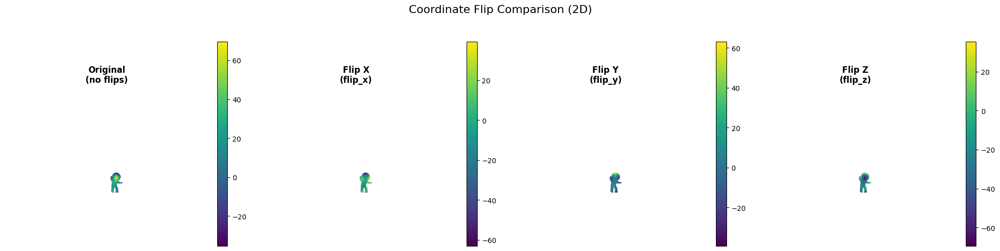


Creating 3D visualizations...
  ✓ original
  ✓ flip_x
  ✓ flip_y
  ✓ flip_z
✓ 3D visualization ready


In [22]:
print("testing flips")

flips = test_four_flips(normal_map, object_mask)
visualize_four_flips_2d(flips, object_mask)
visualize_four_flips_3d(flips, object_mask, albedo_map, 2)


# PICK THE BEST FLIP. ASSIGN IT HERE

In [23]:
best_coordinate_convention = 'original'  
depth = flips[best_coordinate_convention]
print(f"✓ Selected: {best_coordinate_convention}")

✓ Selected: original


## Now we may have to scale the newly flipped depth map to understand how fast the slope is moving

In [24]:
def visualize_scale_comparison_3d(results, mask, albedo_map, subsample=2):
    """Visualize different scales in 3D"""
    n = len(results)
    cols = 3
    rows = (n + cols - 1) // cols
    
    specs = [[{'type': 'scatter3d'} for _ in range(cols)] for _ in range(rows)]
    
    subplot_titles = [name.replace('scale_', 'Scale ') for name in results.keys()]
    
    fig = make_subplots(
        rows=rows, cols=cols,
        specs=specs,
        subplot_titles=subplot_titles,
        vertical_spacing=0.08,
        horizontal_spacing=0.02
    )
    
    print("\nCreating 3D visualizations...")
    
    for idx, (name, depth) in enumerate(results.items()):
        row = (idx // cols) + 1
        col = (idx % cols) + 1
        
        # Create point cloud
        points_3d = []
        albedo_values = []
        
        H, W = depth.shape
        for i in range(0, H, subsample):
            for j in range(0, W, subsample):
                if mask[i, j] > 0:
                    points_3d.append([j, i, depth[i, j]])
                    albedo_values.append(albedo_map[i, j])
        
        points_3d = np.array(points_3d)
        albedo_values = np.array(albedo_values)
        
        # Add trace
        show_colorbar = (idx == len(results) - 1)
        
        fig.add_trace(
            go.Scatter3d(
                x=points_3d[:, 0],
                y=points_3d[:, 1],
                z=points_3d[:, 2],
                mode='markers',
                marker=dict(
                    size=2,
                    color=albedo_values,
                    colorscale='Greys',
                    showscale=show_colorbar,
                    colorbar=dict(title="Albedo", x=1.15) if show_colorbar else None
                ),
                showlegend=False
            ),
            row=row, col=col
        )
        
        print(f"  ✓ {name}")
    
    # Update layout
    fig.update_layout(
        title_text="3D Depth Scaling Comparison",
        height=500 * rows,
        showlegend=False
    )
    
    # Set same camera angle for all
    camera = dict(eye=dict(x=1.5, y=1.5, z=1.5))
    for i in range(1, rows + 1):
        for j in range(1, cols + 1):
            if (i-1)*cols + j <= n:
                fig.update_scenes(camera=camera, row=i, col=j)
    
    print("✓ 3D visualization ready")
    fig.show()
    
    return fig


In [25]:
print("DEPTH SCALING FIX")

test_scales = list([0.1, 0.3, 0.5, 0.7, 0.9])

results = {}
for scale in test_scales:
    results[f'scale_{scale:.3f}'] = depth * scale * object_mask

print("\nGenerating 3D comparison...")
fig = visualize_scale_comparison_3d(results, object_mask, albedo_map, subsample=2)

DEPTH SCALING FIX

Generating 3D comparison...

Creating 3D visualizations...
  ✓ scale_0.100
  ✓ scale_0.300
  ✓ scale_0.500
  ✓ scale_0.700
  ✓ scale_0.900
✓ 3D visualization ready


## And Assign the best one here

In [26]:
best_scale = 1  # Your choice
depth_map = depth * best_scale
print(f"✓ Applied scale: {best_scale}")

✓ Applied scale: 1


## Visualize Results

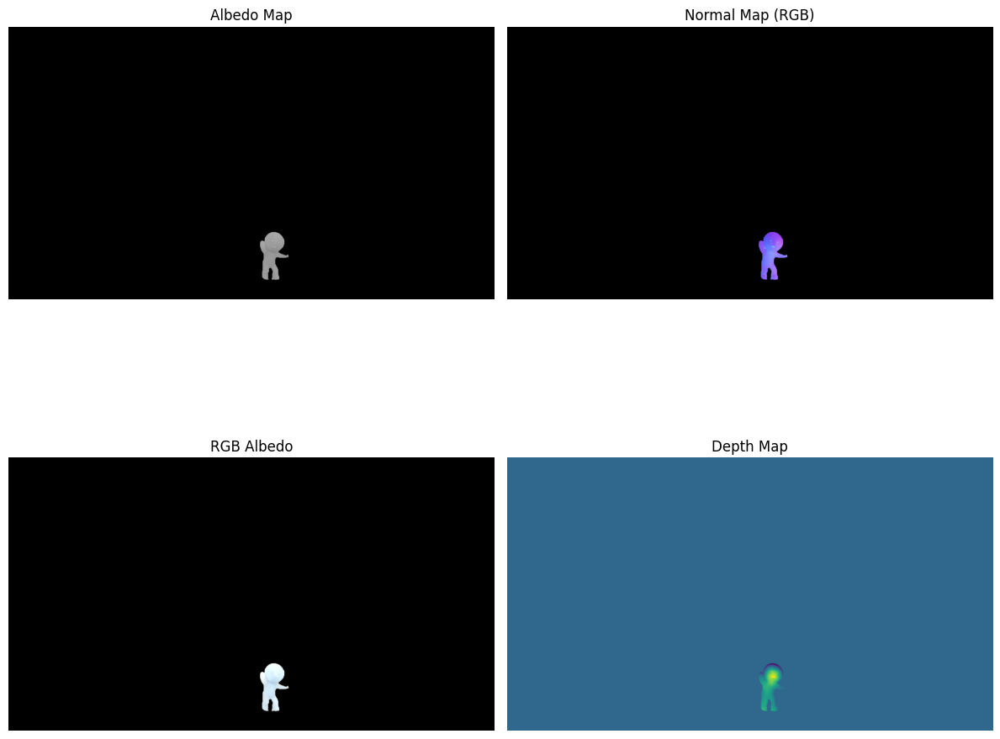

In [27]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Albedo
albedo_norm = albedo_map / albedo_map.max() if albedo_map.max() > 0 else albedo_map
axes[0, 0].imshow(albedo_norm, cmap='gray')
axes[0, 0].set_title('Albedo Map')
axes[0, 0].axis('off')

# Normal map
normal_vis = (normal_map + 1.0) / 2.0 * object_mask[:, :, np.newaxis]
axes[0, 1].imshow(normal_vis)
axes[0, 1].set_title('Normal Map (RGB)')
axes[0, 1].axis('off')

# RGB Albedo
color_norm = color_map / color_map.max() if color_map.max() > 0 else color_map
axes[1, 0].imshow(color_norm)
axes[1, 0].set_title('RGB Albedo')
axes[1, 0].axis('off')

# Depth map
axes[1, 1].imshow(depth_map, cmap='viridis')
axes[1, 1].set_title('Depth Map')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

### 3D Point Cloud Reconstruction

Convert the depth map $z(x,y)$ to a 3D point cloud:

$$\mathbf{P} = \{(x, y, z(x,y)) \\mid M(x,y) = 1\}$$

Each point is colored by its grayscale albedo $\rho(x,y)$ to visualize surface reflectance properties.

The point cloud can be rendered interactively, allowing rotation and inspection of the reconstructed 3D geometry.

## 3D Visualization

## Interactive 3D Visualization with Albedo

In [29]:
def depth_to_point_cloud_with_albedo(depth_map, albedo_map, mask, subsample=1):
    """Convert depth map to point cloud with albedo colors"""
    H, W = depth_map.shape
    points_3d = []
    pixel_coords = []
    albedo_values = []
    
    for i in range(0, H, subsample):
        for j in range(0, W, subsample):
            if mask[i, j] > 0:
                points_3d.append([j, i, depth_map[i, j]])
                pixel_coords.append([i, j])
                albedo_values.append(albedo_map[i, j])
    
    return np.array(points_3d), np.array(pixel_coords), np.array(albedo_values)

def plot_point_cloud_with_albedo(points_3d, albedo_values, colorscale='Greys', 
                                   point_size=4, title='3D Reconstruction - Grayscale Albedo',
                                   camera_eye=dict(x=1.5, y=1.5, z=1.5)):
    """Create interactive 3D point cloud colored by albedo"""
    fig = go.Figure(data=[go.Scatter3d(
        x=points_3d[:, 0],
        y=points_3d[:, 1],
        z=points_3d[:, 2],
        mode='markers',
        marker=dict(
            size=point_size,
            color=albedo_values,
            colorscale=colorscale,
            colorbar=dict(title="Albedo"),
            showscale=True
        )
    )])
    
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Depth',
            camera=dict(eye=camera_eye),
            aspectmode='data'
        ),
        width=900,
        height=900
    )
    
    return fig

# Generate point cloud with albedo
points_3d, pixel_coords, albedo_values = depth_to_point_cloud_with_albedo(
    depth_map, albedo_map, object_mask, subsample=2
)

# Color by grayscale albedo
fig_gray = plot_point_cloud_with_albedo(
    points_3d=points_3d,
    albedo_values=albedo_values,
    colorscale='Greys',
    point_size=3,
    title='3D Reconstruction - Grayscale Albedo',
    camera_eye=dict(x=1.5, y=1.5, z=1.5)
)

fig_gray.show()
print(f'Created interactive 3D visualization with {len(points_3d)} points')

Created interactive 3D visualization with 3027 points


In [35]:
def plot_surface_with_rgb_albedo(depth_map, color_map, mask, subsample=1,
                                  title='3D Surface Reconstruction with RGB Albedo',
                                  camera_eye=dict(x=-1.8, y=2.0, z=1.0)):

    
    H, W = depth_map.shape
    
    # Subsample
    ys = np.arange(0, H, subsample)
    xs = np.arange(0, W, subsample)
    
    depth_sub = depth_map[np.ix_(ys, xs)]
    color_sub = color_map[np.ix_(ys, xs)]
    mask_sub = mask[np.ix_(ys, xs)]
    
    # Mask invalid
    depth_masked = np.where(mask_sub > 0, depth_sub, np.nan)
    
    # Normalize color map to 0-1 range for visualization
    color_norm = color_sub / color_sub.max() if color_sub.max() > 0 else color_sub
    color_norm = np.clip(color_norm, 0, 1)
    
    # Apply mask to color
    color_masked = color_norm.copy()
    color_masked[mask_sub == 0] = 0
    
    # Convert to uint8 for PIL
    color_uint8 = (color_masked * 255).astype(np.uint8)
    
    # Build grid
    X, Y = np.meshgrid(xs, ys)
    
    # Use mesh3d with vertex colors instead of surface
    # Flatten arrays
    x_flat = X.flatten()
    y_flat = Y.flatten()
    z_flat = (-depth_masked).flatten()
    
    # Get RGB colors for each vertex
    r_flat = color_uint8[:, :, 0].flatten()
    g_flat = color_uint8[:, :, 1].flatten()
    b_flat = color_uint8[:, :, 2].flatten()
    
    # Create triangulation for mesh
    # For each quad, create 2 triangles
    i_indices = []
    j_indices = []
    k_indices = []
    
    rows, cols = depth_masked.shape
    for row in range(rows - 1):
        for col in range(cols - 1):
            # Get indices of quad corners
            idx_tl = row * cols + col
            idx_tr = row * cols + (col + 1)
            idx_bl = (row + 1) * cols + col
            idx_br = (row + 1) * cols + (col + 1)
            
            # Skip if any corner is masked
            if (np.isnan(z_flat[idx_tl]) or np.isnan(z_flat[idx_tr]) or 
                np.isnan(z_flat[idx_bl]) or np.isnan(z_flat[idx_br])):
                continue
            
            # Triangle 1: top-left, top-right, bottom-left
            i_indices.append(idx_tl)
            j_indices.append(idx_tr)
            k_indices.append(idx_bl)
            
            # Triangle 2: top-right, bottom-right, bottom-left
            i_indices.append(idx_tr)
            j_indices.append(idx_br)
            k_indices.append(idx_bl)
    
    # Replace NaN with 0 for plotting
    z_flat_clean = np.nan_to_num(z_flat, 0)
    
    fig = go.Figure(data=[
        go.Mesh3d(
            x=x_flat,
            y=y_flat,
            z=z_flat_clean,
            i=i_indices,
            j=j_indices,
            k=k_indices,
            vertexcolor=np.stack([r_flat, g_flat, b_flat], axis=1),
            lighting=dict(
                ambient=0.7,
                diffuse=0.8,
                roughness=0.5,
                specular=0.3
            ),
            lightposition=dict(x=100, y=200, z=300)
        )
    ])
    
    fig.update_layout(
        title=title,
        width=900,
        height=900,
        margin=dict(l=0, r=0, b=0, t=30),
        paper_bgcolor='black',  # Background outside the plot
        plot_bgcolor='black',   # Background of the plot area
        font=dict(color='white'),  # Make title white
        scene=dict(
            xaxis=dict(visible=False, backgroundcolor='black', gridcolor='black'),
            yaxis=dict(visible=False, backgroundcolor='black', gridcolor='black'),
            zaxis=dict(visible=False, backgroundcolor='black', gridcolor='black'),
            bgcolor='black',  # 3D scene background
            aspectmode='data',
            aspectratio=dict(x=1, y=1, z=1)
        ),
        scene_camera=dict(
            eye=camera_eye,
            up=dict(x=0, y=0, z=1)
        )
    )
    
    return fig


# Plot with RGB albedo
print("Creating 3D surface with RGB albedo...")
fig_surface_rgb = plot_surface_with_rgb_albedo(
    depth_map=depth_map,
    color_map=color_map,
    mask=object_mask,
    subsample=2,  # Subsample for performance
    title="3D Surface Reconstruction (Depth + RGB Albedo)",
    camera_eye=dict(x=-1.8, y=2.0, z=1.0)
)

fig_surface_rgb.show()

Creating 3D surface with RGB albedo...
